In [1]:
from mesa import Agent, Model
import json
import numpy as np
import geopandas as gpd
import random
import time
from mesa.time import RandomActivation
from mesa.datacollection import DataCollector
from mesa.batchrunner import BatchRunnerMP,BatchRunner
import skmob

### Load data

In [2]:
with open('travel_dist.json') as f:
    travel_dist = json.load(f)

In [3]:
with open('start_region_dist.json') as f:
    start_region_dist = json.load(f)

In [4]:
with open('trip_len_work.json') as f:
    trip_len_work = json.load(f)

In [5]:
with open('trip_len_leisure.json') as f:
    trip_len_leisure = json.load(f)

### Probabilities

In [6]:
for key, value in travel_dist.items():
    s = travel_dist[key]['true'] + travel_dist[key]['false']
    travel_dist[key]['true'] = travel_dist[key]['true'] / s
    travel_dist[key]['false'] = 1 - travel_dist[key]['true']

In [7]:
s = np.array(list(start_region_dist.values())).astype(int).sum()
for key, value in start_region_dist.items():
    start_region_dist[key] = int(start_region_dist[key]) / s

In [8]:
for key, value in trip_len_work.items():
    s = np.array(list(value.values())).astype(int).sum()
    if s != 0:
        for i in range(1, 136):
            trip_len_work[key][str(i)] = trip_len_work[key][str(i)] / s

In [9]:
for key, value in trip_len_leisure.items():
    s = np.array(list(value.values())).astype(int).sum()
    if s != 0:
        for i in range(1, 136):
            trip_len_leisure[key][str(i)] = trip_len_leisure[key][str(i)] / s

### Regions

In [10]:
wroc_map = gpd.read_file('EtapII-REJONY_wroclaw.shp')
city_regions = wroc_map[['NUMBER', 'geometry']]
city_regions.columns = ['REGION', 'geometry']
city_regions = city_regions.to_crs(epsg=4326)

### Model

In [89]:
class ECCAgent(Agent):
    """An agent with fixed initial wealth."""
    def __init__(self, unique_id, model):
        super().__init__(unique_id, model)
        self.start_region = self._sample_region()
        self.current_region = self.start_region
        self.on_the_way = self._sample_status()
        self.end_region = self.start_region
        self.trip_type = self._sample_trip_type()
        
        if self.on_the_way:
            self.regions_num_left = self._sample_regions_num() - 1
        else:
            self.regions_num_left = 0

        self.regions_num = self.regions_num_left
        
    def _sample_trip_type(self):
        if random.randint(0, 10) <= 7:
            return 'HomeToWorkSchoolOther'
        else:
            return 'Leisure'
        
    def _sample_region(self):

        sample = np.random.multinomial(1, list(start_region_dist.values()))
        sample = np.argmax(sample)
        region = list(start_region_dist.keys())[sample]

        return region

    def _sample_status(self):

        try:
            sample = np.random.multinomial(1, list(travel_dist[str(self.start_region)].values()))
        except KeyError:
            sample = np.random.multinomial(1, np.zeros(2))
        status = not np.argmax(sample)

        return status

    def _sample_regions_num(self):
        regions_num = 0
        if self.trip_type == 'HomeToWorkSchoolOther':
            try:
                sample = np.random.multinomial(1, list(trip_len_work[str(self.start_region)].values()))
            except KeyError:
                sample = np.random.multinomial(1, np.zeros(136))

        else:
            try:
                sample = np.random.multinomial(1, list(trip_len_leisure[str(self.start_region)].values()))
            except KeyError:
                sample = np.random.multinomial(1, np.zeros(136))
             
        regions_num = np.argmax(sample) + 1
        if self.trip_type == 'HomeToWorkSchoolOther' and regions_num == 136: # if probability vector contains only 0
            regions_num = 1
            
        return regions_num

    def move(self):

        current_region = city_regions[city_regions['REGION'] == int(self.current_region)].iloc[0]
        neighbors = city_regions[~city_regions.geometry.disjoint(current_region.geometry)]
        neighbors = neighbors['REGION'].to_list()

        self.current_region = np.random.choice(neighbors)
        self.regions_num_left = self.regions_num_left - 1

    def step(self):
        
        if self.on_the_way:

            self.move()            

            if self.regions_num_left == 0:
                self.on_the_way = False
                self.end_region = self.current_region



In [90]:
class ECCModel(Model):
    """A model with some number of agents."""
    def __init__(self, N):
        self.num_agents = N
        self.schedule = RandomActivation(self)
        self.running = True
        # Create agents
        for i in range(self.num_agents):
            a = ECCAgent(i, self)
            self.schedule.add(a)
        self.datacollector = DataCollector(
            agent_reporters={
                "regions_num": "regions_num",
                "start_region": "start_region",
                "end_region": "end_region",
                "trip_type": "trip_type"
            }
        )

    def step(self):
        self.datacollector.collect(self)
        self.schedule.step()

In [91]:
start_time = time.time()
model = ECCModel(100)
for i in range(136):
    model.step()
print(round(time.time() - start_time), 's')

17 s


In [92]:
results = model.datacollector.get_agent_vars_dataframe().reset_index()
results = results[results["Step"] == 135]

results

,Step,AgentID,regions_num,start_region,end_region,trip_type
13500,135,0,25,222,112,HomeToWorkSchoolOther
13501,135,1,28,39,117,HomeToWorkSchoolOther
13502,135,2,9,35,91,HomeToWorkSchoolOther
13503,135,3,14,11,169,HomeToWorkSchoolOther
13504,135,4,0,95,95,Leisure
...,...,...,...,...,...,...
13595,135,95,4,15,333,HomeToWorkSchoolOther
13596,135,96,9,361,272,Leisure
13597,135,97,0,50,50,HomeToWorkSchoolOther
13598,135,98,14,154,155,Leisure


In [93]:
results_leisure = results[results["trip_type"] == 'Leisure']

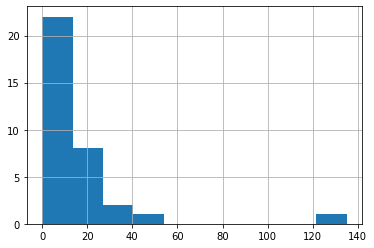

In [94]:
results_leisure['regions_num'].hist()

In [95]:
results_other = results[results["trip_type"] == 'HomeToWorkSchoolOther']

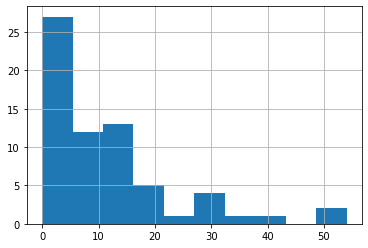

In [96]:
results_other['regions_num'].hist()

In [18]:
batch_run = BatchRunnerMP(
    ECCModel,
    nr_processes=1,
    variable_parameters={"N": [1000]},
    fixed_parameters={},
    iterations=10,
    max_steps=135,
    agent_reporters={
        "regions_num": "regions_num",
        "start_region": "start_region",
        "end_region": "end_region",
        "trip_type": "trip_type"
    }
)

start_time = time.time()
batch_run.run_all()
print()
print(round(time.time() - start_time), 's')


2772 s


In [19]:
results = batch_run.get_agent_vars_dataframe().reset_index()
results_leisure = results[results['trip_type']=='Leisure']
result_work = results[results['trip_type']=='HomeToWorkSchoolOther']
results_leisure = results_leisure[['start_region', 'end_region']].groupby(['start_region', 'end_region']).size().reset_index(name='flows')
results_leisure['start_region'] = results_leisure['start_region'].astype(int)
results_leisure['end_region'] = results_leisure['end_region'].astype(int)
results_leisure['flows'] = results_leisure['flows'].astype(int)

In [20]:
result_work = result_work[['start_region', 'end_region']].groupby(['start_region', 'end_region']).size().reset_index(name='flows')
result_work['start_region'] = result_work['start_region'].astype(int)
result_work['end_region'] = result_work['end_region'].astype(int)
result_work['flows'] = result_work['flows'].astype(int)

In [23]:
fdf_leisure = skmob.FlowDataFrame(
    data=results_leisure,
    origin='start_region',
    destination='end_region',
    flow='flows',
    tile_id='REGION',
    tessellation=city_regions
)

In [26]:
m = fdf_leisure.plot_tessellation(tiles='OpenStreetMap')
fdf_leisure.plot_flows(m, tiles='OpenStreetMap', min_flow=2)

In [27]:
fdf_work = skmob.FlowDataFrame(
    data=result_work,
    origin='start_region',
    destination='end_region',
    flow='flows',
    tile_id='REGION',
    tessellation=city_regions
)

In [30]:
m = fdf_work.plot_tessellation(tiles='OpenStreetMap')
fdf_work.plot_flows(m, tiles='OpenStreetMap', min_flow=3)

In [31]:
batch_run = BatchRunnerMP(
    ECCModel,
    nr_processes=1,
    variable_parameters={"N": [10000]},
    fixed_parameters={},
    iterations=10,
    max_steps=135,
    agent_reporters={
        "regions_num": "regions_num",
        "start_region": "start_region",
        "end_region": "end_region",
        "trip_type": "trip_type"
    }
)

start_time = time.time()
batch_run.run_all()
print()
print(round(time.time() - start_time), 's')


23663 s


In [32]:
results = batch_run.get_agent_vars_dataframe().reset_index()
results_leisure = results[results['trip_type']=='Leisure']
result_work = results[results['trip_type']=='HomeToWorkSchoolOther']
results_leisure = results_leisure[['start_region', 'end_region']].groupby(['start_region', 'end_region']).size().reset_index(name='flows')
results_leisure['start_region'] = results_leisure['start_region'].astype(int)
results_leisure['end_region'] = results_leisure['end_region'].astype(int)
results_leisure['flows'] = results_leisure['flows'].astype(int)

In [33]:
result_work = result_work[['start_region', 'end_region']].groupby(['start_region', 'end_region']).size().reset_index(name='flows')
result_work['start_region'] = result_work['start_region'].astype(int)
result_work['end_region'] = result_work['end_region'].astype(int)
result_work['flows'] = result_work['flows'].astype(int)

In [34]:
fdf_leisure = skmob.FlowDataFrame(
    data=results_leisure,
    origin='start_region',
    destination='end_region',
    flow='flows',
    tile_id='REGION',
    tessellation=city_regions
)

In [39]:
m = fdf_leisure.plot_tessellation(tiles='OpenStreetMap')
fdf_leisure.plot_flows(m, tiles='OpenStreetMap', min_flow=8)

In [40]:
fdf_work = skmob.FlowDataFrame(
    data=result_work,
    origin='start_region',
    destination='end_region',
    flow='flows',
    tile_id='REGION',
    tessellation=city_regions
)

In [43]:
m = fdf_work.plot_tessellation(tiles='OpenStreetMap')
fdf_work.plot_flows(m, tiles='OpenStreetMap', min_flow=20)

In [45]:
results = results[['start_region', 'end_region']].groupby(['start_region', 'end_region']).size().reset_index(name='flows')
results['start_region'] = results['start_region'].astype(int)
results['end_region'] = results['end_region'].astype(int)
results['flows'] = results['flows'].astype(int)

In [46]:
fdf = skmob.FlowDataFrame(
    data=results,
    origin='start_region',
    destination='end_region',
    flow='flows',
    tile_id='REGION',
    tessellation=city_regions
)

In [48]:
m = fdf.plot_tessellation(tiles='OpenStreetMap')
fdf.plot_flows(m, tiles='OpenStreetMap', min_flow=30)